In [52]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0,1,2,3"
from diffusers import UNet2DConditionModel, DDPMScheduler
import torch
from torch.optim import AdamW
from dataset import ADNIDatasetSlicesInOrder
from torch.utils.data import DataLoader
from utils import sample_16_indices, indices_to_mask, save_tloss_csv, load_or_initialize_training, load_trained_model, plot_batch_slices, normalise_intensity
import numpy as np
import matplotlib.pyplot as plt

In [21]:
device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")

In [22]:
batch_size = 4

## Experiment 5 or 6

In [23]:
num_train_timesteps=256
slices_at_once = 4

In [24]:
model = UNet2DConditionModel(
    sample_size=128,
    in_channels=2*slices_at_once, #16
    out_channels=slices_at_once, #8 #initialise to maximum and compute loss only for indexed slices
    down_block_types=("DownBlock2D", "DownBlock2D", "DownBlock2D", "DownBlock2D", "AttnDownBlock2D"),
    mid_block_type=None,
    up_block_types=("AttnUpBlock2D", "UpBlock2D", "UpBlock2D", "UpBlock2D", "UpBlock2D"),
    # not sure about what the lower arguments do
    block_out_channels=(64, 128, 256, 512, 1024), #start with 64? no deeper than 1024
    layers_per_block=2, #default
    # cross_attention_dim=256, # ~concat one-hot encodings of condition and target slices~ NO now instead just one 128 vector with labels 0,1,2
    attention_head_dim=8, #default
    norm_num_groups=32, #default
    use_linear_projection=True #DIFFERENT
)

In [25]:
model.to(device)

UNet2DConditionModel(
  (conv_in): Conv2d(8, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=64, out_features=256, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=256, out_features=256, bias=True)
  )
  (down_blocks): ModuleList(
    (0): DownBlock2D(
      (resnets): ModuleList(
        (0-1): 2 x ResnetBlock2D(
          (norm1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (time_emb_proj): Linear(in_features=256, out_features=64, bias=True)
          (norm2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (dropout): Dropout(p=0.0, inplace=False)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (nonlinearity): SiLU()
        )
      )
      (downsamplers): ModuleList(
        (0): Downsample2D(
          (conv): Conv2d(64

In [26]:
noise_scheduler = DDPMScheduler(num_train_timesteps=num_train_timesteps)

In [27]:
load_trained_model(model, 'experiment6/latest_ckpt.pth.tar')

Checkpoint loaded from epoch 680.


In [28]:
noised_target_slices = torch.randn(batch_size, slices_at_once, 128, 128, device=device)

In [29]:
condition_slices = torch.zeros_like(noised_target_slices)

In [30]:
target_slices = noised_target_slices

# for t in noise_scheduler.timesteps.flip(0):
for t in noise_scheduler.timesteps:
    print(f't is {t}')
    timesteps = torch.tensor([t], device=device, dtype=torch.float32).repeat(batch_size)

    input_tensor = torch.concat((target_slices, condition_slices), dim=1)

    with torch.no_grad():
        predicted_noise = model(input_tensor, timesteps, None).sample

    target_slices = noise_scheduler.step(predicted_noise, t, target_slices).prev_sample

t is 255
t is 254
t is 253
t is 252
t is 251
t is 250
t is 249
t is 248
t is 247
t is 246
t is 245
t is 244
t is 243
t is 242
t is 241
t is 240
t is 239
t is 238
t is 237
t is 236
t is 235
t is 234
t is 233
t is 232
t is 231
t is 230
t is 229
t is 228
t is 227
t is 226
t is 225
t is 224
t is 223
t is 222
t is 221
t is 220
t is 219
t is 218
t is 217
t is 216
t is 215
t is 214
t is 213
t is 212
t is 211
t is 210
t is 209
t is 208
t is 207
t is 206
t is 205
t is 204
t is 203
t is 202
t is 201
t is 200
t is 199
t is 198
t is 197
t is 196
t is 195
t is 194
t is 193
t is 192
t is 191
t is 190
t is 189
t is 188
t is 187
t is 186
t is 185
t is 184
t is 183
t is 182
t is 181
t is 180
t is 179
t is 178
t is 177
t is 176
t is 175
t is 174
t is 173
t is 172
t is 171
t is 170
t is 169
t is 168
t is 167
t is 166
t is 165
t is 164
t is 163
t is 162
t is 161
t is 160
t is 159
t is 158
t is 157
t is 156
t is 155
t is 154
t is 153
t is 152
t is 151
t is 150
t is 149
t is 148
t is 147
t is 146
t is 145
t

In [31]:
predicted_noise.shape

torch.Size([4, 4, 128, 128])

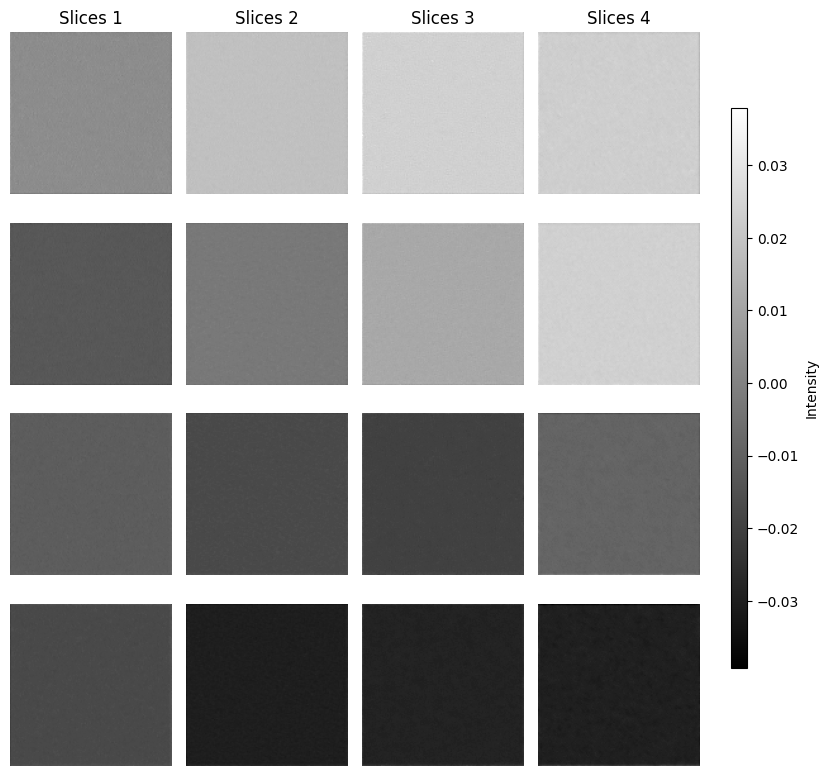

In [32]:
plot_batch_slices(target_slices, batch_size=batch_size, slices=slices_at_once)

### Giving condition slices

In [39]:
noised_target_slices = torch.randn(batch_size, slices_at_once, 128, 128, device=device)

In [40]:
data_dir = "/cim/ehoney/ecse626proj/preprocessed_data"
train_dataset = ADNIDatasetSlicesInOrder(data_dir, sample_full_brain=True)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=8) # CHANGE to NUM_WORKERS=4

In [41]:
one_batch = next(iter(train_dataloader))

In [72]:
condition_slices = one_batch[:, 4:4+slices_at_once].float().to(device)

In [101]:
def sample_next_slices(noise_scheduler, noised_target_slices, condition_slices, verbose=False):

    target_slices = noised_target_slices

    # for t in noise_scheduler.timesteps.flip(0):
    for t in noise_scheduler.timesteps:
        if verbose:
            print(f't is {t}')
        timesteps = torch.tensor([t], device=device, dtype=torch.float32).repeat(batch_size)

        input_tensor = torch.concat((target_slices, condition_slices), dim=1)

        with torch.no_grad():
            predicted_noise = model(input_tensor, timesteps, None).sample

        target_slices = noise_scheduler.step(predicted_noise, t, target_slices).prev_sample

    return target_slices

In [92]:
condition_slices = torch.zeros_like(noised_target_slices)
output_batch = torch.zeros(batch_size, 128, 128, 128)

start_index = 0
for i in range(start_index, 128, slices_at_once):
    print(f'Sampling slices {i} to {i+slices_at_once}...')
    noised_target_slices = torch.randn(batch_size, slices_at_once, 128, 128, device=device)
    
    target_slices = sample_next_slices(noise_scheduler, noised_target_slices, condition_slices)
    target_slices = normalise_intensity(target_slices.cpu()).to(device)

    output_batch[:, i:i+slices_at_once] = target_slices

    print(f'Complete.')

    condition_slices = target_slices.float()
    

Sampling slices 0 to 4...
t is 255
t is 254
t is 253
t is 252
t is 251
t is 250
t is 249
t is 248
t is 247
t is 246
t is 245
t is 244
t is 243
t is 242
t is 241
t is 240
t is 239
t is 238
t is 237
t is 236
t is 235
t is 234
t is 233
t is 232
t is 231
t is 230
t is 229
t is 228
t is 227
t is 226
t is 225
t is 224
t is 223
t is 222
t is 221
t is 220
t is 219
t is 218
t is 217
t is 216
t is 215
t is 214
t is 213
t is 212
t is 211
t is 210
t is 209
t is 208
t is 207
t is 206
t is 205
t is 204
t is 203
t is 202
t is 201
t is 200
t is 199
t is 198
t is 197
t is 196
t is 195
t is 194
t is 193
t is 192
t is 191
t is 190
t is 189
t is 188
t is 187
t is 186
t is 185
t is 184
t is 183
t is 182
t is 181
t is 180
t is 179
t is 178
t is 177
t is 176
t is 175
t is 174
t is 173
t is 172
t is 171
t is 170
t is 169
t is 168
t is 167
t is 166
t is 165
t is 164
t is 163
t is 162
t is 161
t is 160
t is 159
t is 158
t is 157
t is 156
t is 155
t is 154
t is 153
t is 152
t is 151
t is 150
t is 149
t is 148
t 

In [102]:
start_index = 4
condition_slices = one_batch[:, start_index:start_index+slices_at_once].float().to(device)
output_batch = torch.zeros(batch_size, 128, 128, 128)

for i in range(start_index, 128, slices_at_once):
    print(f'Sampling slices {i} to {i+slices_at_once}...')
    noised_target_slices = torch.randn(batch_size, slices_at_once, 128, 128, device=device)
    
    target_slices = sample_next_slices(noise_scheduler, noised_target_slices, condition_slices)
    target_slices = normalise_intensity(target_slices.cpu()).to(device)

    output_batch[:, i:i+slices_at_once] = target_slices

    print(f'Complete.')

    condition_slices = target_slices.float()
    

Sampling slices 4 to 8...
Complete.
Sampling slices 8 to 12...
Complete.
Sampling slices 12 to 16...
Complete.
Sampling slices 16 to 20...
Complete.
Sampling slices 20 to 24...
Complete.
Sampling slices 24 to 28...
Complete.
Sampling slices 28 to 32...
Complete.
Sampling slices 32 to 36...
Complete.
Sampling slices 36 to 40...
Complete.
Sampling slices 40 to 44...
Complete.
Sampling slices 44 to 48...
Complete.
Sampling slices 48 to 52...
Complete.
Sampling slices 52 to 56...
Complete.
Sampling slices 56 to 60...
Complete.
Sampling slices 60 to 64...
Complete.
Sampling slices 64 to 68...
Complete.
Sampling slices 68 to 72...
Complete.
Sampling slices 72 to 76...
Complete.
Sampling slices 76 to 80...
Complete.
Sampling slices 80 to 84...
Complete.
Sampling slices 84 to 88...
Complete.
Sampling slices 88 to 92...
Complete.
Sampling slices 92 to 96...
Complete.
Sampling slices 96 to 100...
Complete.
Sampling slices 100 to 104...
Complete.
Sampling slices 104 to 108...
Complete.
Sampling s

In [103]:
output_batch[:, :start_index] = one_batch[:, start_index:start_index+slices_at_once].float().to(device)

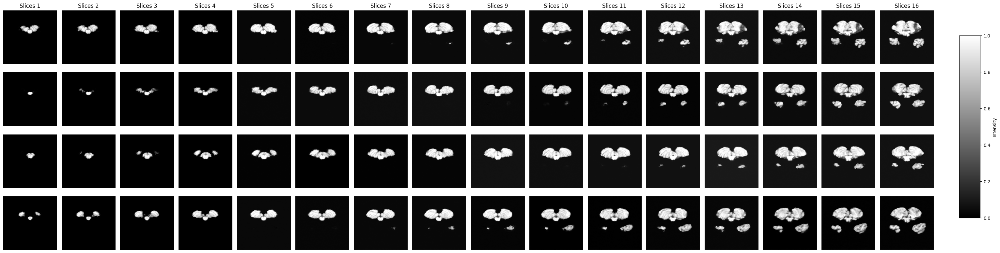

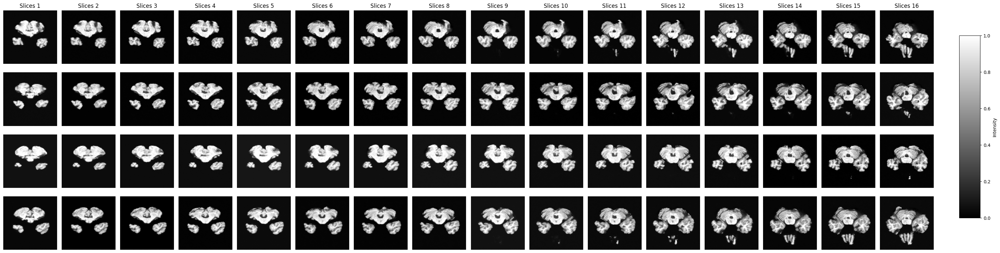

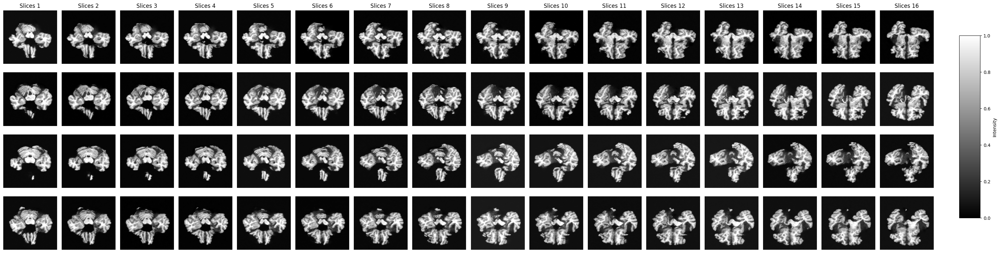

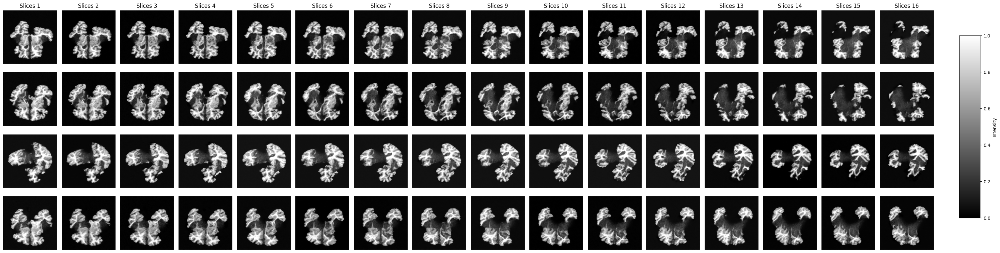

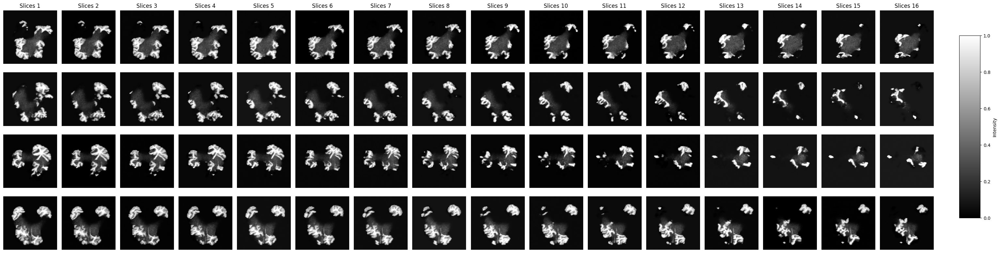

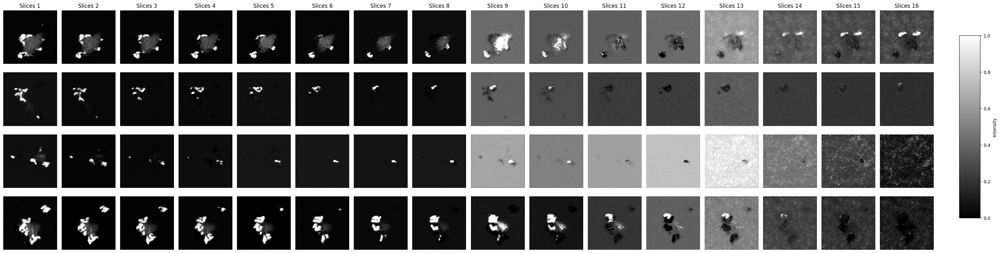

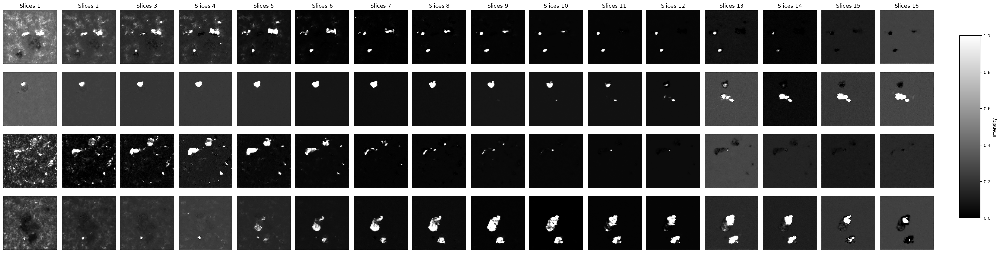

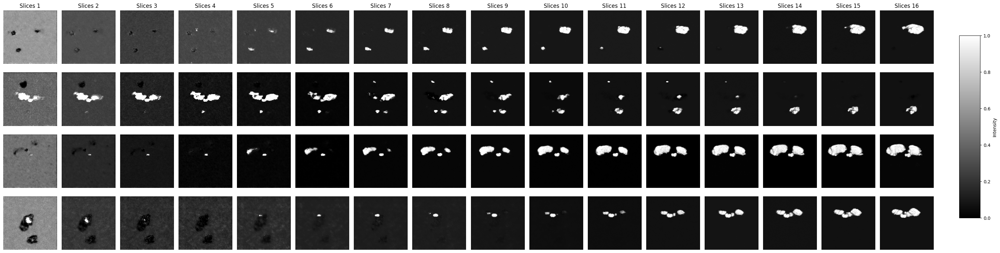

In [ ]:
for i in range(0, 128, 16):
    plot_batch_slices(output_batch[:, i:i+16], batch_size=batch_size, slices=16)

In [ ]:
start_index = 8
condition_slices = one_batch[:, start_index:start_index+slices_at_once].float().to(device)
output_batch = torch.zeros(batch_size, 128, 128, 128)

for i in range(start_index, 128, slices_at_once):
    print(f'Sampling slices {i} to {i+slices_at_once}...')
    noised_target_slices = torch.randn(batch_size, slices_at_once, 128, 128, device=device)
    
    target_slices = sample_next_slices(noise_scheduler, noised_target_slices, condition_slices)
    target_slices = normalise_intensity(target_slices.cpu()).to(device)

    output_batch[:, i:i+slices_at_once] = target_slices

    print(f'Complete.')

    condition_slices = target_slices.float()
    

Sampling slices 8 to 12...
Complete.
Sampling slices 12 to 16...
Complete.
Sampling slices 16 to 20...
Complete.
Sampling slices 20 to 24...


In [ ]:
output_batch[:, :start_index] = one_batch[:, start_index:start_index+slices_at_once].float().to(device)

In [ ]:
for i in range(0, 128, 16):
    plot_batch_slices(output_batch[:, i:i+16], batch_size=batch_size, slices=16)